In [1]:
import os
import matplotlib.pyplot as plt
import random
from PIL import Image

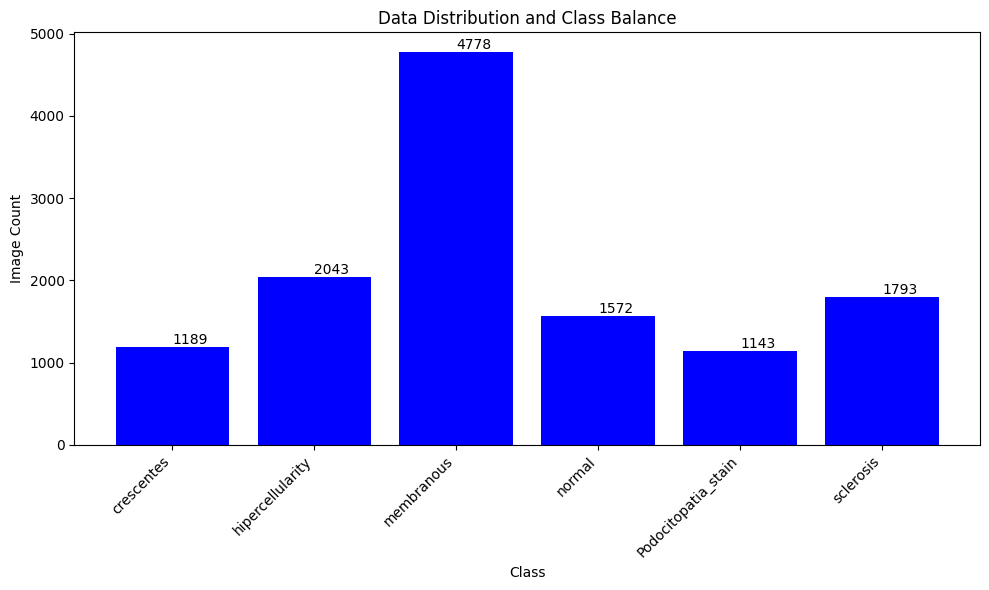

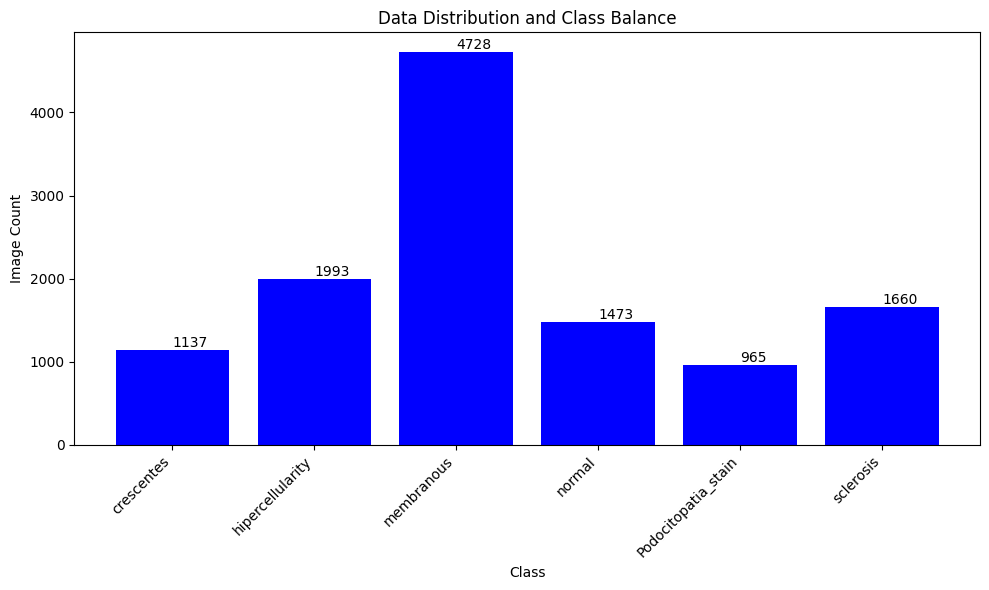

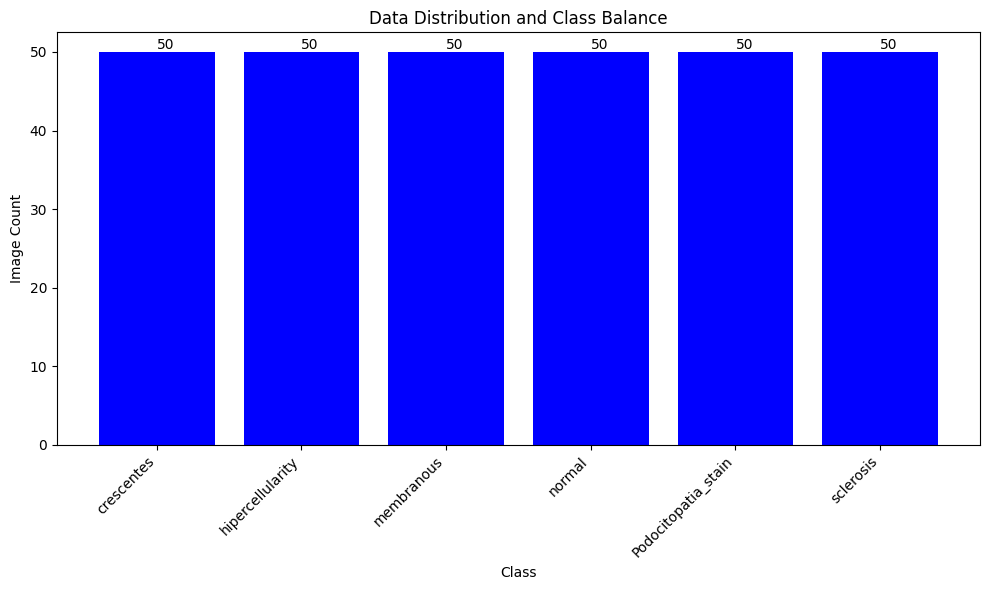

In [8]:
def plot_distribution(data_mode, data_dir):
    # Initialize variables to store class names and image counts
    class_names = []
    class_counts = []

    # Traverse through the directory structure
    for class_name in os.listdir(data_dir):
        class_dir = os.path.join(data_dir, class_name)
        if os.path.isdir(class_dir):
            class_names.append(class_name)
            image_count = sum([len(files) for _, _, files in os.walk(class_dir)])
            class_counts.append(image_count)

    # Plot data distribution and class balance
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, class_counts, color='blue')
    plt.xlabel('Class')
    plt.ylabel('Image Count')
    plt.title('Data Distribution and Class Balance')
    plt.xticks(rotation=45, ha='right')

    # Adding values on top of the bars
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom')

    plt.tight_layout()
    plt.show()


plot_distribution(
    data_mode="Raw Data" , 
    data_dir="../data/01_raw/"
    )
plot_distribution(
    data_mode="Train Data" , 
    data_dir="../data/02_data_split/train_data/"
    )
plot_distribution(
    data_mode="Test Data" , 
    data_dir="../data/02_data_split/test_data/"
    )

Total number of images: 12518


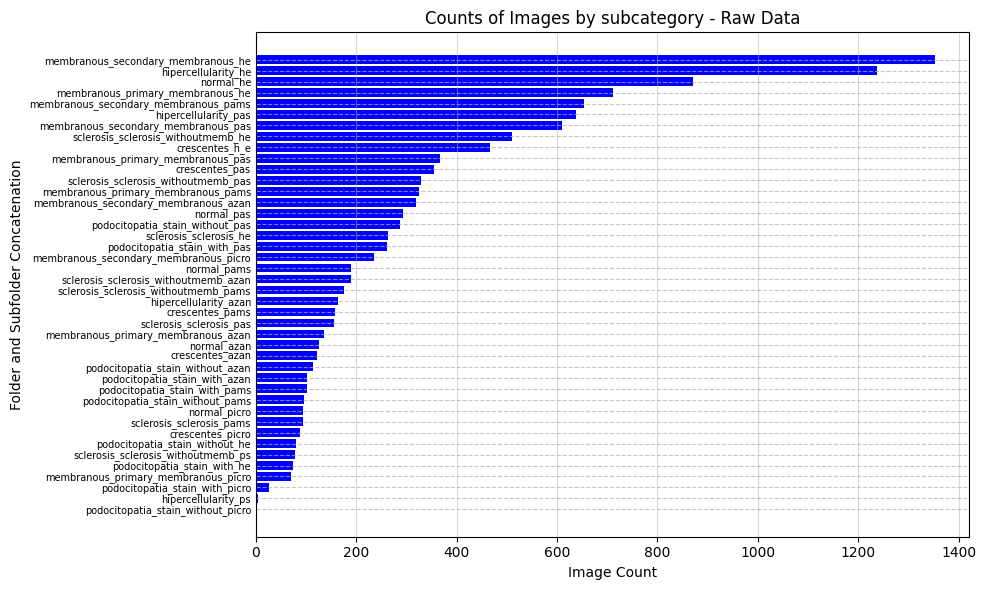

Total number of images: 11956


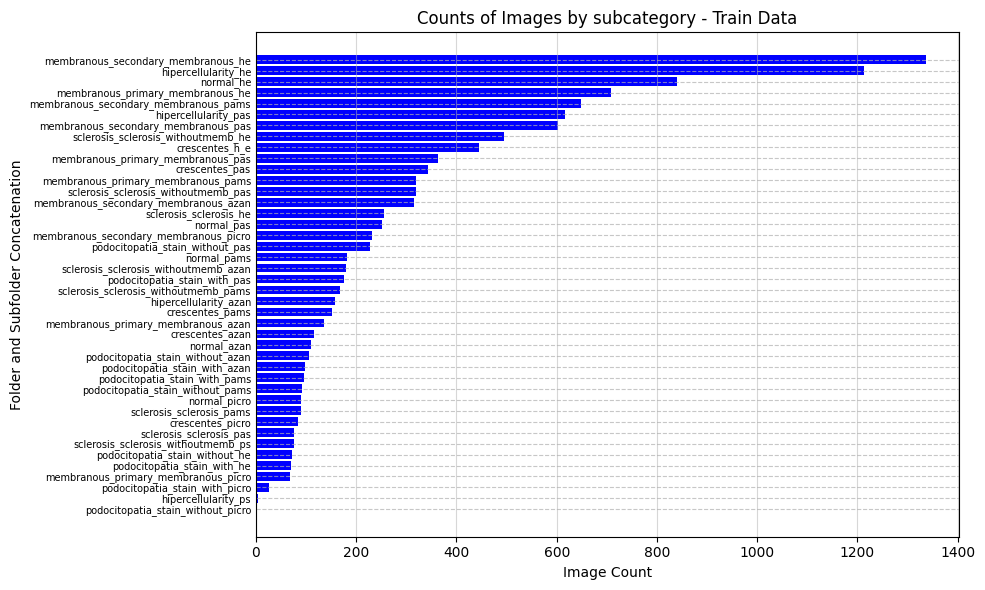

Total number of images: 300


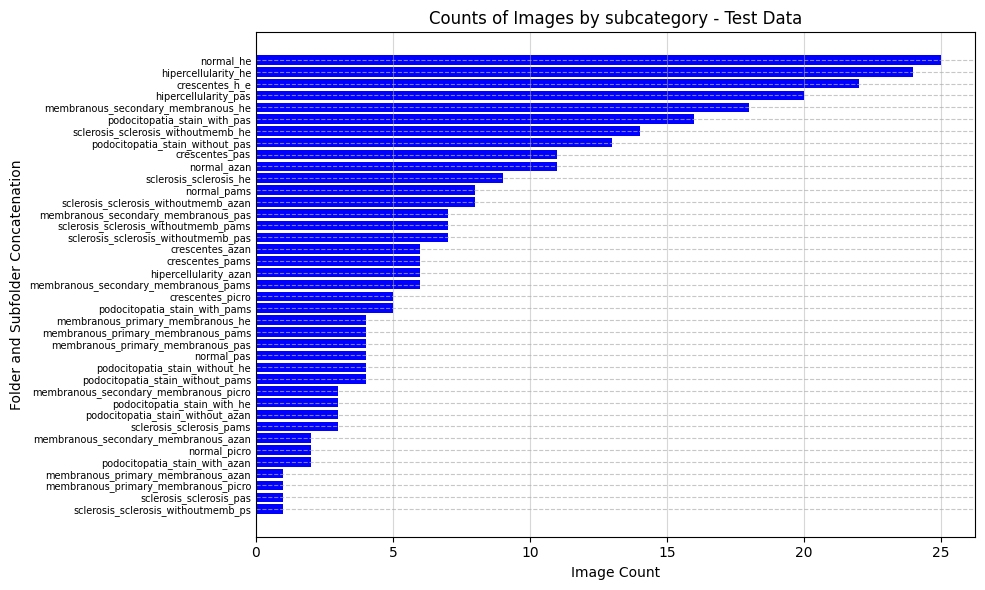

In [33]:
def plot_subcategory_dist(data_mode, root_dir):
    # Initialize a dictionary to store concatenated names and image counts
    name_counts = {}

    # Traverse through the directory structure
    for root, _, files in os.walk(root_dir):
        if files:  # Only consider directories containing files
            folders = os.path.relpath(root, root_dir).split(os.path.sep)
            concatenated_name = '_'.join(folders).lower()
            image_count = len(files)
            
            if concatenated_name in name_counts:
                name_counts[concatenated_name] += image_count
            else:
                name_counts[concatenated_name] = image_count

    # Sort the dictionary by image counts in descending order
    sorted_name_counts = dict(sorted(name_counts.items(), key=lambda item: item[1], reverse=True))

    count = 0
    for i in name_counts.keys():
        count = count + name_counts[i]

    print(f'Total number of images: {count}')

    # Plot horizontal histogram
    plt.figure(figsize=(10, 6))
    plt.barh(list(sorted_name_counts.keys()), list(sorted_name_counts.values()), color='blue', linewidth = 2)
    plt.xlabel('Image Count')
    plt.ylabel('Folder and Subfolder Concatenation')
    plt.title(f'Counts of Images by subcategory - {data_mode}')
    plt.yticks(fontsize=7)
    plt.tight_layout()

    # Adjusting the spacing between y-ticks for better visualization
    plt.gca().yaxis.grid(True, linestyle='--', alpha=0.7)
    plt.gca().xaxis.grid(True, alpha=0.5)
    plt.gca().invert_yaxis()  # Invert y-axis for top-down visualization
    plt.gca().tick_params(axis='y', which='both', length=0)  # Hide y-tick marks


    plt.show()



plot_subcategory_dist(
    data_mode="Raw Data" , 
    root_dir="../data/01_raw/"
    )
plot_subcategory_dist(
    data_mode="Train Data" , 
    root_dir="../data/02_data_split/train_data/"
    )
plot_subcategory_dist(
    data_mode="Test Data" , 
    root_dir="../data/02_data_split/test_data/"
    )

In [67]:
def is_image_file(filename):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']
    ext = os.path.splitext(filename)[1].lower()
    return ext in image_extensions

def check_for_image_files(folder_path):
    no_image_files = False
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if is_image_file(file):
                no_image_files = True
                break
    return no_image_files



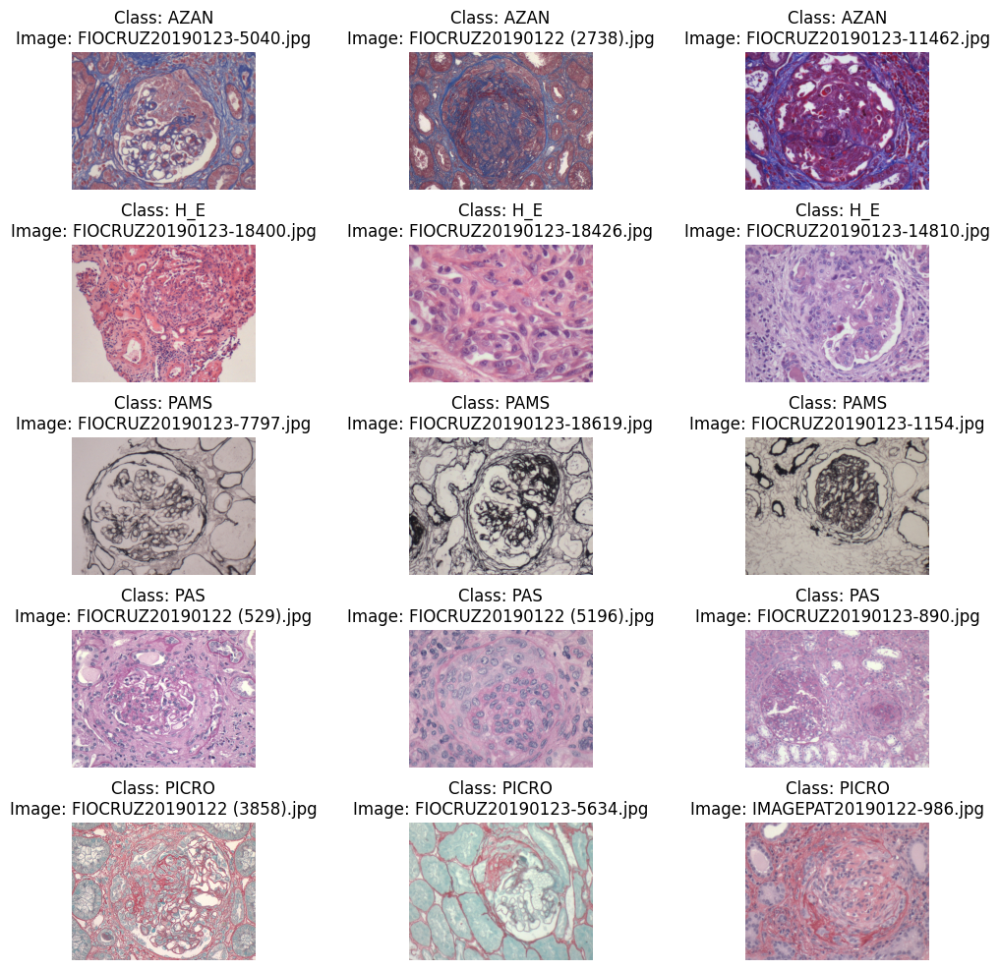

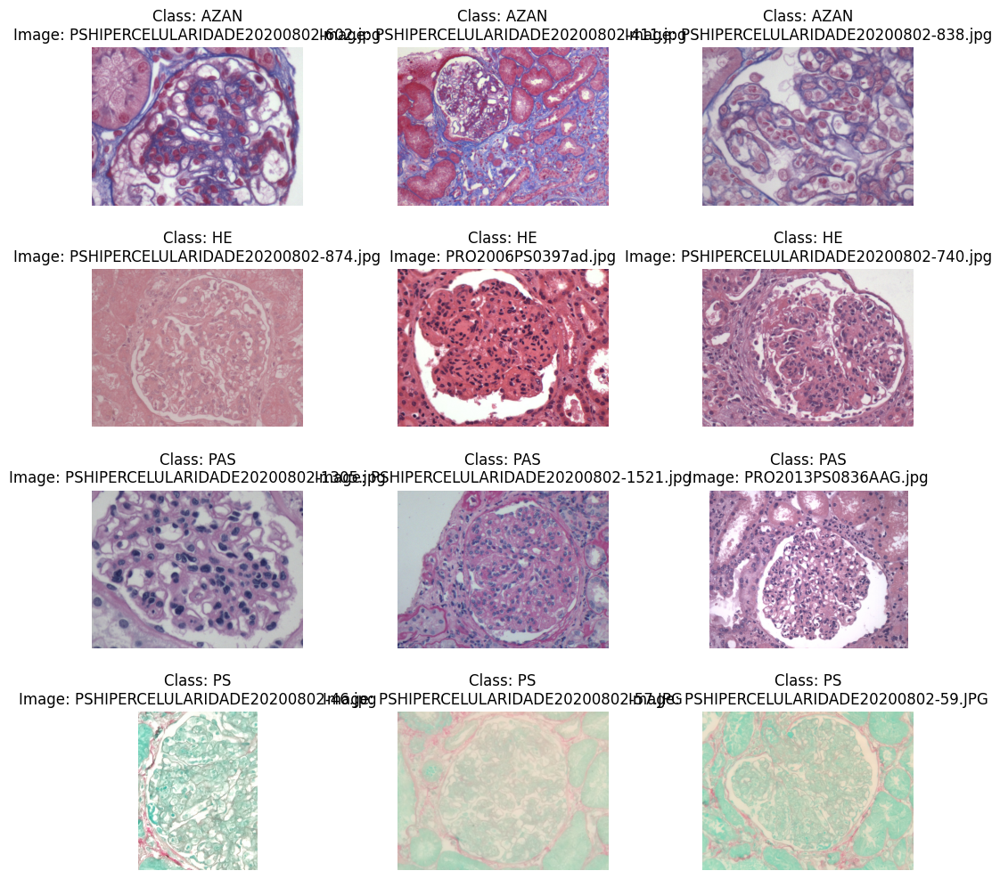

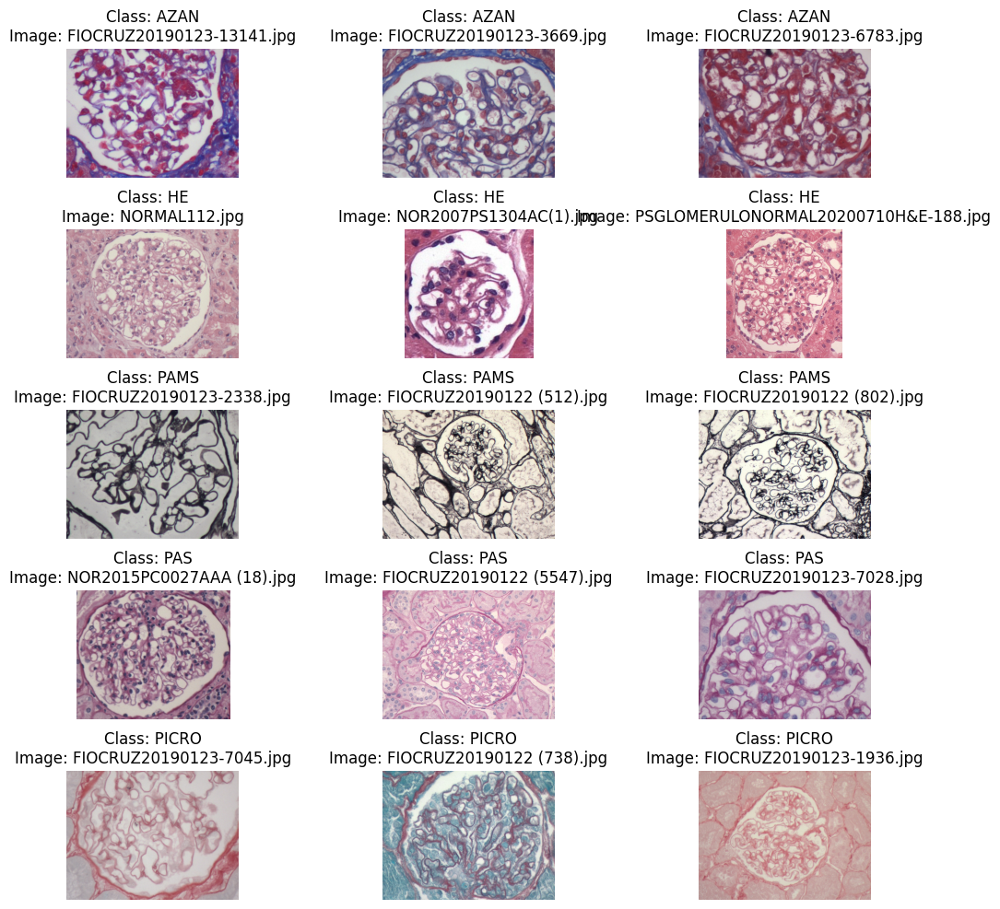

In [71]:


def plot_images_by_class(root_dir):
    def is_image_file(filename):
        image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']
        ext = os.path.splitext(filename)[1].lower()
        return ext in image_extensions

    def check_for_image_files(folder_path):
        no_image_files = False
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                if is_image_file(file):
                    no_image_files = True
                    break
        return no_image_files

    classes = []
    categories = os.listdir(root_dir)
    for cat in categories:
        if check_for_image_files(os.path.join(root_dir, cat)):
            classes.append(cat)

    num_rows = len(classes)
    num_images_per_class = 3
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 12))
    plt.subplots_adjust(wspace=0.4, hspace=0.4)

    # Traverse through the directory structure
    for i, class_name in enumerate(classes):
        class_dir = os.path.join(root_dir, class_name)
        if os.path.isdir(class_dir):
            # print(f"Class: {class_name}")
            image_files = []
            for _, _, files in os.walk(class_dir):
                image_files.extend(files)
            
            # Display random images from the class

            for j in range(num_images_per_class):
                random_image_file = random.choice(image_files)
                image_path = os.path.join(class_dir, random_image_file)
                
                # Load and display the image
                image = Image.open(image_path)
                ax = axes[i, j]
                ax.imshow(image)
                ax.set_title(f"Class: {class_name}\nImage: {random_image_file}")
                ax.axis('off')



### crescentes

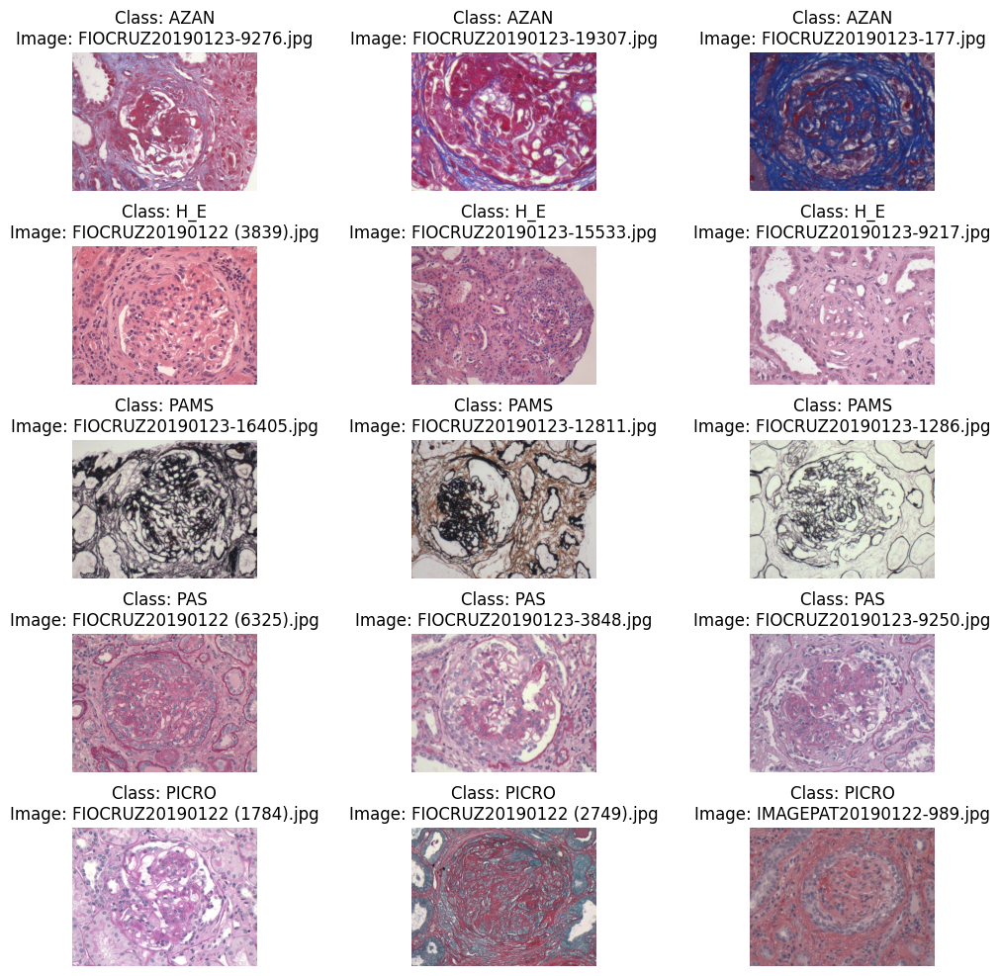

In [72]:

plot_images_by_class("../data/01_raw/crescentes")

### hipercellularity

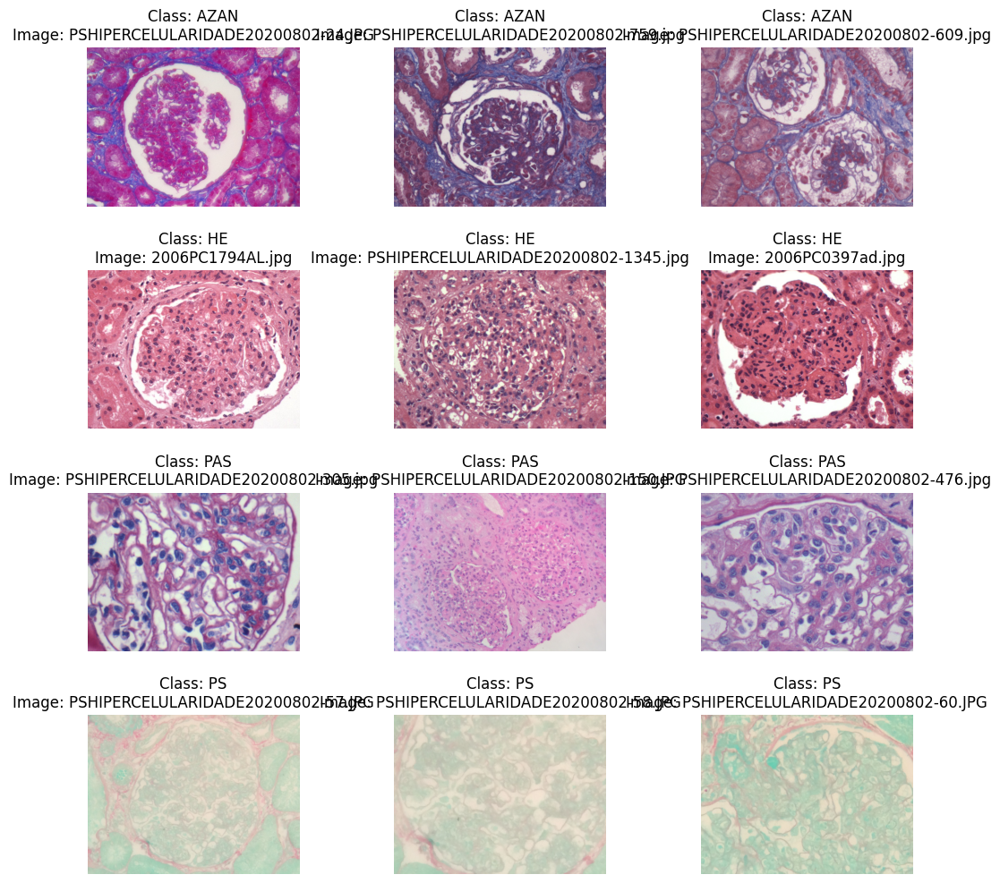

In [73]:
plot_images_by_class("../data/01_raw/hipercellularity")

### Normal

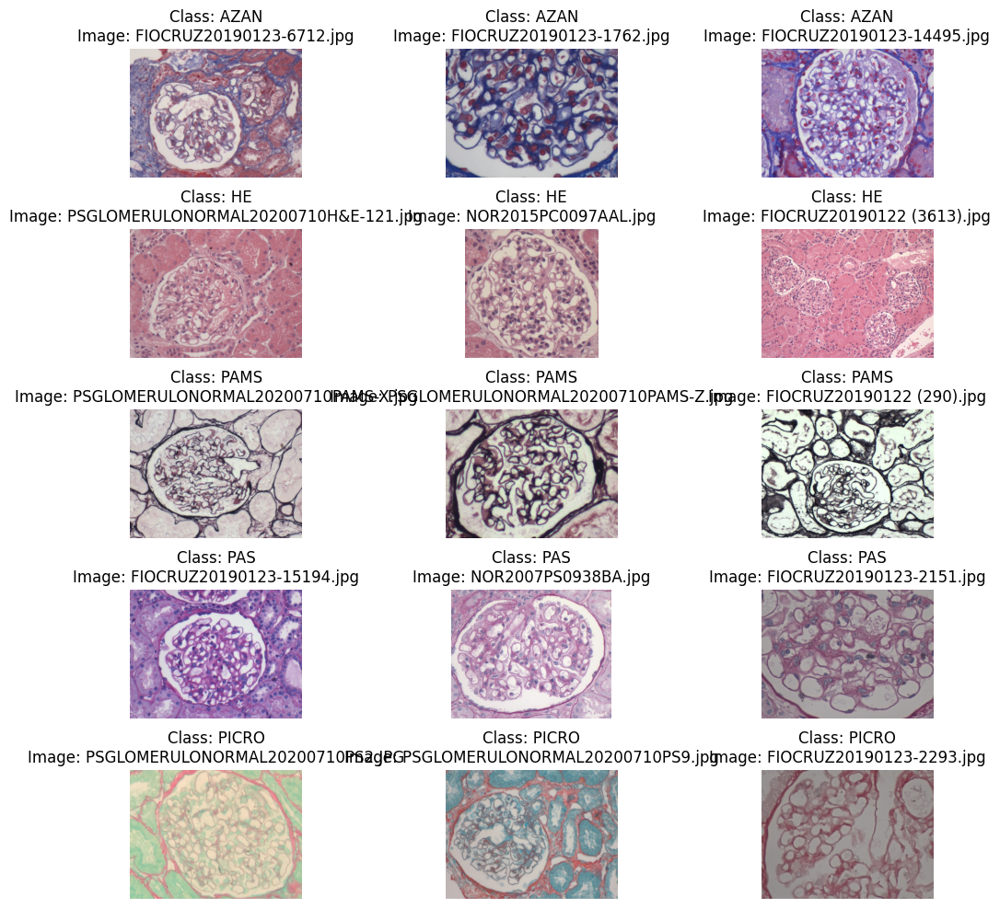

In [75]:
plot_images_by_class("../data/01_raw/normal")

In [98]:
# plot_images_by_class("../data/01_raw/sclerosis")
# plot_images_by_class("../data/01_raw/Podocitopatia_stain")

In [1]:
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle
from pathlib import Path

In [182]:
path = "./data/01_raw/"
data_dir = Path(path)

file_names = []
images = []
file_class = []

# Loop over the image files in the data directory and its subdirectories

for image_file in data_dir.glob('**/*.jpg'):
    # Get the path to the image file
    image_path = image_file.as_posix()
    index = image_path.rfind('/')
    file_name = image_path[index+1:]
    images.append(image_path)
    file_names.append(file_name)
    file_class.append(image_path.split('/')[2])

In [183]:
def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [ ]:
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)


   
data = {}
p = "C:/Users/Maods/Documents/Development/Mestrado/terumo/apps/renal-pathology-retrieval/data_output/"

# lop through each image in the dataset
for image in images:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(image,model)
        data[image] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data,file)
          
 


In [239]:
p = "C:/Users/Maods/Documents/Development/Mestrado/terumo/apps/renal-pathology-retrieval/data_output/embeddings/"
file_to_save = Path(p)
# file_to_save.parents[0].mkdir(parents=True, exist_ok=True)

# file = file_to_save.as_posix() + '/vgg_emb.pkl'
# with open(p,'wb') as a:
#     pickle.dump(data,a)

In [3]:
import torch
from torch.utils.data import DataLoader, Subset
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import numpy as np
from PIL import Image

from torchvision import transforms
from torchvision.datasets import ImageFolder

class ImageDataLoader:
    def __init__(self, data_dir):
        self.data_dir = data_dir
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        self.dataset = ImageFolder(self.data_dir, transform=self.transform, target_transform=self._get_class_name)
     
    def __len__(self):
        return len(self.dataset)

    def __iter__(self):
        return iter(self.dataloader)

    def _get_class_name(self, index):
        return index


In [5]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16 = models.vgg16()
vgg16.classifier = vgg16.classifier[:2]
vgg16.to(device)
vgg16.eval()

batch_size = 100

data = ImageDataLoader("C:/Users/Maods/Documents/Development/Mestrado/terumo/apps/renal-pathology-retrieval/data/01_raw/")
dataloader = DataLoader(data.dataset, batch_size=batch_size, shuffle=False)

In [34]:
import os
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as transforms

class ImageDataLoader:
    def __init__(self, data_dir):
        self.data_dir = data_dir
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        self.dataset = ImageFolder(self.data_dir, transform=self.transform, target_transform=self._get_class_name)
        
        self.paths = [path for path, _ in self.dataset.samples]
        self.labels = [target for _, target in self.dataset.samples]

        self.dataloader = DataLoader(self.dataset, shuffle=False)

    def __len__(self):
        return len(self.dataset)

    def __iter__(self):
        return iter(self.dataloader)

    def _get_class_name(self, index):
        return index


# Example usage
data_dir = "C:/Users/Maods/Documents/Development/Mestrado/terumo/apps/renal-pathology-retrieval/data/02_data_split/test_data"
data_loader = ImageDataLoader(data_dir)
dataloader = DataLoader(data_loader.dataset, batch_size=batch_size, shuffle=False)
for batch_idx, (images, targets) in enumerate(dataloader):
    # batch_paths = data_loader.paths[batch_idx * data_loader.dataloader.batch_size : (batch_idx + 1) * data_loader.dataloader.batch_size]
    # batch_labels = data_loader.labels[batch_idx * data_loader.dataloader.batch_size : (batch_idx + 1) * data_loader.dataloader.batch_size]
    
    # Now you have access to both image paths and labels for the current batch
    print("Batch Paths:", images.shape)
    print("Batch Labels:", targets)

Batch Paths: torch.Size([100, 3, 224, 224])
Batch Labels: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1])
Batch Paths: torch.Size([100, 3, 224, 224])
Batch Labels: tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3, 3, 3, 3])
Batch Paths: torch.Size([100, 3, 224, 224])
Batch Labels: tensor([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,

In [24]:
batch_paths

['C:/Users/Maods/Documents/Development/Mestrado/terumo/apps/renal-pathology-retrieval/data/02_data_split/test_data\\sclerosis\\sclerosis_withoutMemb\\PS\\PSESCLEROSE20201002-920.jpg']

In [166]:
all_feature_embeddings = np.empty((0, 4096))
labels = []
for i, (x, y) in enumerate(dataloader):
    x = x.to(device=device)
    with torch.no_grad():
        batch_features = vgg16(x)

    batch_features = batch_features.view(batch_features.size(0), -1).cpu().numpy()
    all_feature_embeddings = np.vstack((all_feature_embeddings, batch_features))
    labels.extend(list(y.cpu().detach().numpy()))



In [167]:
all_feature_embeddings.shape

(12516, 4096)

In [189]:
import pickle 

data_dict = {
    "embedding":all_feature_embeddings,
    "labels":labels
}

pickle_file_path = '../data_output/embeddings/vgg16_4096_pretrained.pickle'

# Save the dictionary as a binary pickle file
with open(pickle_file_path, 'wb') as pickle_file:
    pickle.dump(data_dict, pickle_file)

In [ ]:
# Perform PCA for dimensionality reduction
pca = PCA(n_components=2)
pca_result = pca.fit_transform(data)

# Perform t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_result = tsne.fit_transform(data)

# Perform UMAP for dimensionality reduction
umap_reducer = umap.UMAP(n_components=2)
umap_result = umap_reducer.fit_transform(data)

# Create a figure with subplots for each method
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot PCA clusters
axes[0].scatter(pca_result[:, 0], pca_result[:, 1], c=labels, cmap='viridis', s=10)
axes[0].set_title('PCA')
axes[0].axis('off')

# Plot t-SNE clusters
axes[1].scatter(tsne_result[:, 0], tsne_result[:, 1], c=labels, cmap='viridis', s=10)
axes[1].set_title('t-SNE')
axes[1].axis('off')

# Plot UMAP clusters
axes[2].scatter(umap_result[:, 0], umap_result[:, 1], c=labels, cmap='viridis', s=10)
axes[2].set_title('UMAP')
axes[2].axis('off')

plt.tight_layout()
plt.show()

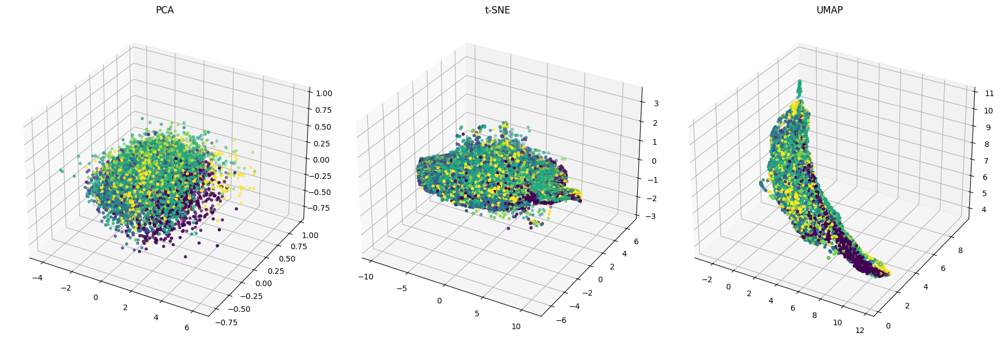

In [5]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(data)

# Perform t-SNE for dimensionality reduction
tsne = TSNE(n_components=3, perplexity=30, n_iter=300)
tsne_result = tsne.fit_transform(data)

# Perform UMAP for dimensionality reduction
umap_reducer = umap.UMAP(n_components=3)
umap_result = umap_reducer.fit_transform(data)

# Create a 3D scatter plot for each method
fig = plt.figure(figsize=(18, 6))

# Plot PCA clusters in 3D
ax1 = fig.add_subplot(131, projection='3d')
ax1.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=labels, cmap='viridis', s=10)
ax1.set_title('PCA')

# Plot t-SNE clusters in 3D
ax2 = fig.add_subplot(132, projection='3d')
ax2.scatter(tsne_result[:, 0], tsne_result[:, 1], tsne_result[:, 2], c=labels, cmap='viridis', s=10)
ax2.set_title('t-SNE')

# Plot UMAP clusters in 3D
ax3 = fig.add_subplot(133, projection='3d')
ax3.scatter(umap_result[:, 0], umap_result[:, 1], umap_result[:, 2], c=labels, cmap='viridis', s=10)
ax3.set_title('UMAP')

plt.tight_layout()
plt.show()

In [7]:
import plotly.express as px

def create_3d_plot(data, labels, title):
    fig = px.scatter_3d(data_frame=data, x=0, y=1, z=2, color=labels, title=title, width=800, height=600,)
    fig.update_traces(marker=dict(size=3))
    fig.show()

create_3d_plot(pca_result, labels, 'PCA Clusters')
create_3d_plot(tsne_result, labels, 't-SNE Clusters')
create_3d_plot(umap_result, labels, 'UMAP Clusters')